In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

In [2]:
adata = sc.read('../../../pipeline/data/multigrate/pbmc_healthy_covid/3670b308bf_adata_both.h5ad')
adata

AnnData object with n_obs × n_vars = 624325 × 2000
    obs: 'sample_id', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'full_clustering', 'initial_clustering', 'Resample', 'Collection_Day', 'Sex', 'Age_interval', 'Swab_result', 'Status', 'Smoker', 'Status_on_day_collection', 'Status_on_day_collection_summary', 'Days_from_onset', 'Site', 'time_after_LPS', 'Worst_Clinical_Status', 'Outcome', 'patient_id', 'split0', 'split1', 'split2', 'split3', 'split4', 'group', 'cell_attn_0', 'cell_attn_1', 'cell_attn_2', 'cell_attn_3', 'cell_attn_4', 'cell_attn'
    var: 'feature_types', 'means', 'variances', 'residual_variances', 'highly_variable_rank', 'highly_variable_nbatches', 'highly_variable_intersection', 'highly_variable'
    uns: 'hvg', 'leiden', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap', 'latent_0', 'latent_1', 'latent_2', 'latent_3', 'latent_4'
    layers: 'counts'

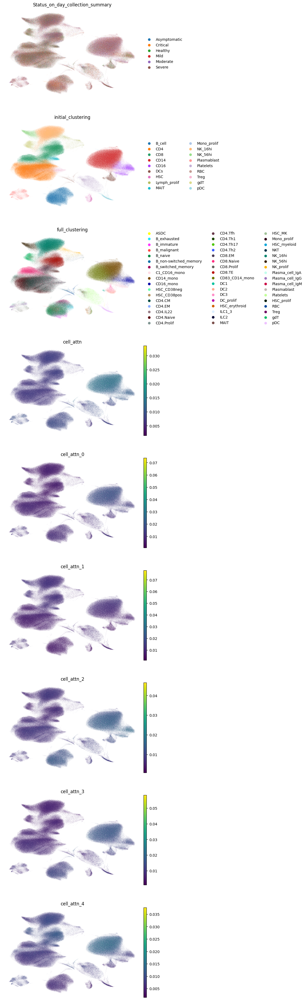

In [3]:
sc.pl.umap(
    adata,
    color=['Status_on_day_collection_summary', 'initial_clustering', 'full_clustering',
           'cell_attn', 'cell_attn_0', 'cell_attn_1', 'cell_attn_2', 'cell_attn_3', 'cell_attn_4'],
    ncols=1,
    frameon=False
)

-------- Asymptomatic -------


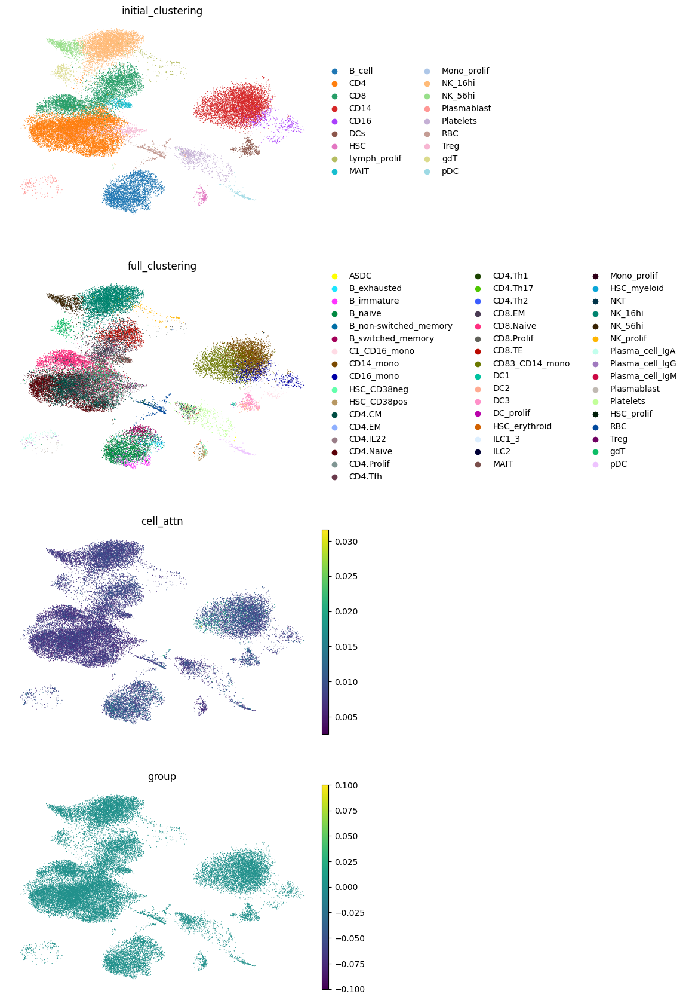

-------- Critical -------


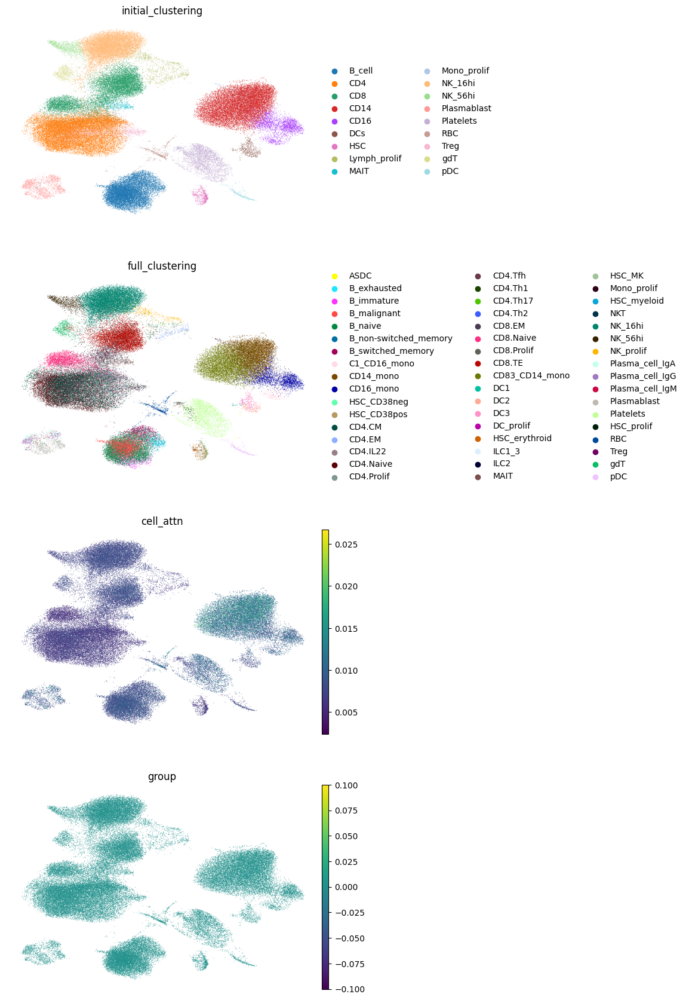

-------- Healthy -------


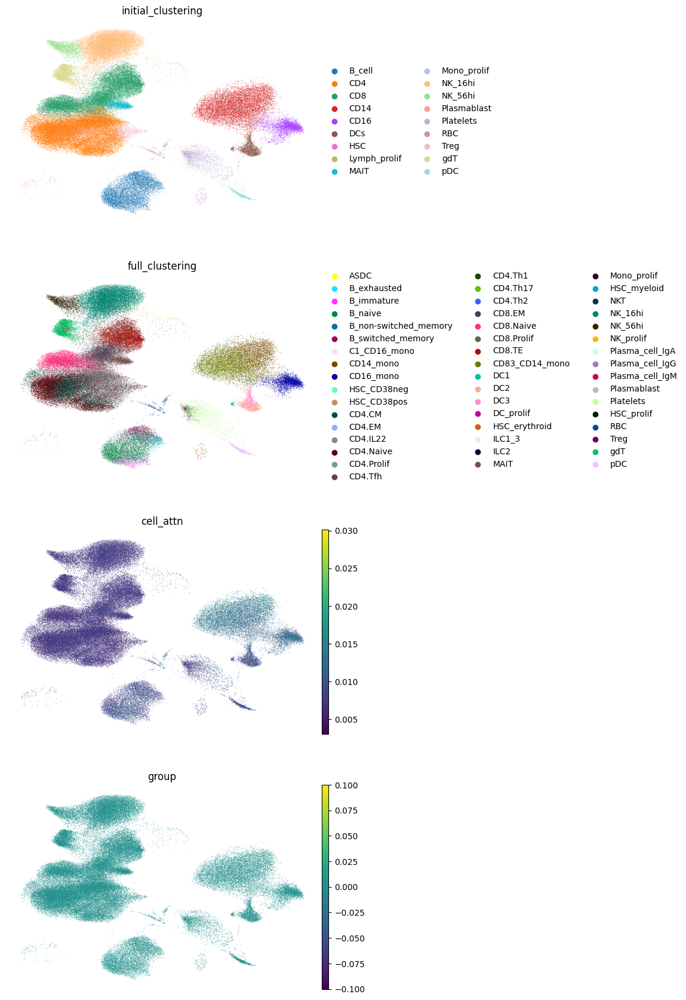

-------- Mild -------


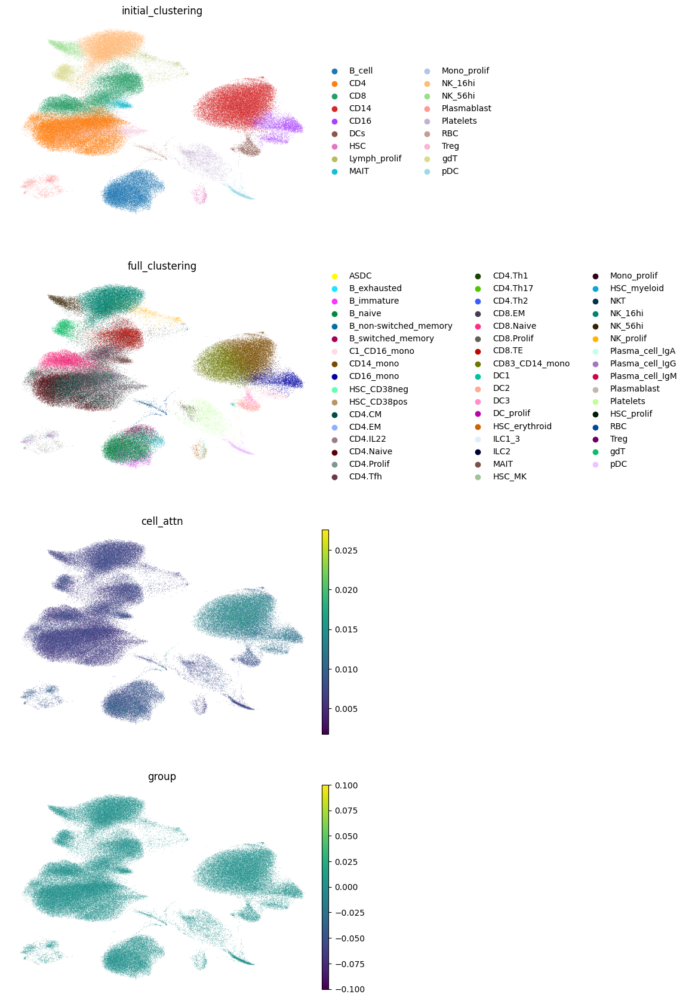

-------- Moderate -------


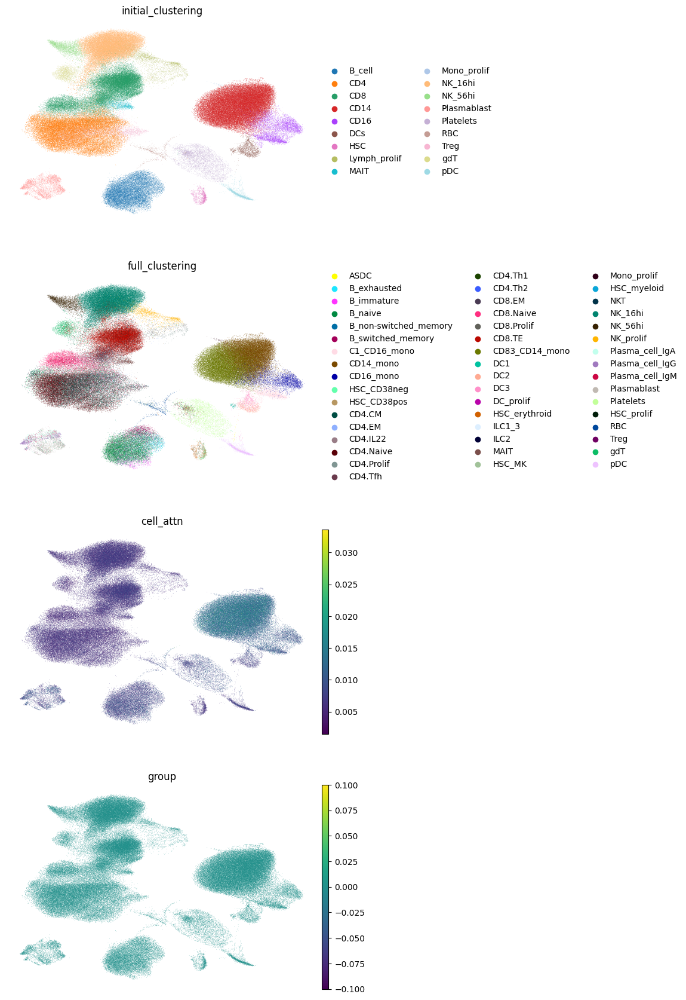

-------- Severe -------


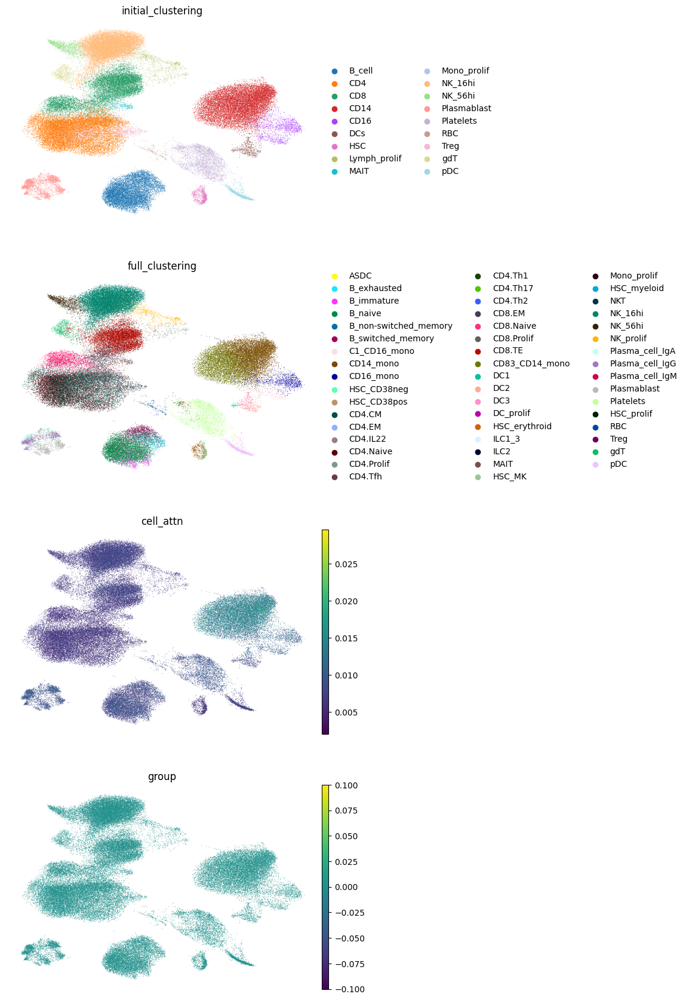

In [4]:
for cond in np.unique(adata.obs['Status_on_day_collection_summary']):
    adata_tmp = adata[adata.obs['Status_on_day_collection_summary'] == cond].copy()
    print(f'-------- {cond} -------')
    sc.pl.umap(
        adata_tmp,
        color=['initial_clustering', 'full_clustering', 'cell_attn', 'group'],
        ncols=1,
        frameon=False
    )

In [5]:
dfs = []
for cond in np.unique(adata.obs['Status_on_day_collection_summary']):
    adata_tmp = adata[adata.obs['Status_on_day_collection_summary'] == cond].copy()
    threshold_idx = int(len(adata_tmp) * 0.9)
    threshold_value = sorted(adata_tmp.obs['cell_attn'])[threshold_idx]
    adata_tmp.obs['group'] = 'all cells'
    adata_tmp.obs.loc[adata_tmp.obs['cell_attn'] >= threshold_value, 'group'] = 'top 10% cells'
    adata.obs[f'top_cells_{cond}'] = False
    adata.obs.loc[adata_tmp[adata_tmp.obs['group'] == 'top 10% cells'].obs_names, f'top_cells_{cond}'] = True
    adata.obs[f'top_cells_{cond}'] = adata.obs[f'top_cells_{cond}'].astype('category')
    dfs.append(adata_tmp[adata_tmp.obs['group'] == 'top 10% cells'].obs[['initial_clustering', 'Status_on_day_collection_summary']])

In [6]:
adata.obs.loc[adata_tmp[adata_tmp.obs['group'] == 'top 10% cells'].obs_names, 'top_cells_Severe']

covid_index
AAACCTGGTGCCTTGG-MH9143325    True
AAACGGGAGGCCATAG-MH9143325    True
AAACGGGCAAGTAGTA-MH9143325    True
AAACGGGCAGCTATTG-MH9143325    True
AAAGCAACAAACCTAC-MH9143325    True
                              ... 
BGCV15_TCTTTCCTCTGATACG-1     True
BGCV15_TGCGGGTCAGGTGGAT-1     True
BGCV15_TGCTACCCAGTCAGAG-1     True
BGCV15_TGGTTCCTCTGCTGCT-1     True
BGCV15_TTCGAAGGTTCCCGAG-1     True
Name: top_cells_Severe, Length: 7827, dtype: category
Categories (2, bool): [False, True]

In [7]:
np.sum(adata.obs['top_cells_Severe'] == True)

7827

In [8]:
adata.obs.loc[adata_tmp[adata_tmp.obs['group'] == 'top 10% cells'].obs_names, f'top_cells_{cond}']

covid_index
AAACCTGGTGCCTTGG-MH9143325    True
AAACGGGAGGCCATAG-MH9143325    True
AAACGGGCAAGTAGTA-MH9143325    True
AAACGGGCAGCTATTG-MH9143325    True
AAAGCAACAAACCTAC-MH9143325    True
                              ... 
BGCV15_TCTTTCCTCTGATACG-1     True
BGCV15_TGCGGGTCAGGTGGAT-1     True
BGCV15_TGCTACCCAGTCAGAG-1     True
BGCV15_TGGTTCCTCTGCTGCT-1     True
BGCV15_TTCGAAGGTTCCCGAG-1     True
Name: top_cells_Severe, Length: 7827, dtype: category
Categories (2, bool): [False, True]

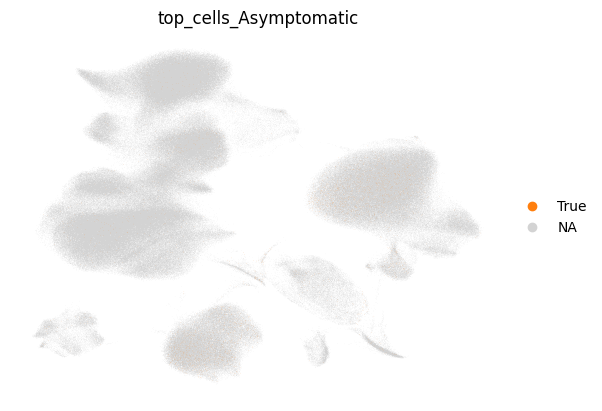

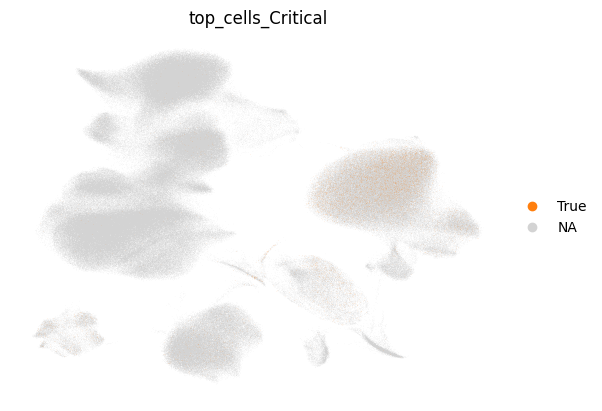

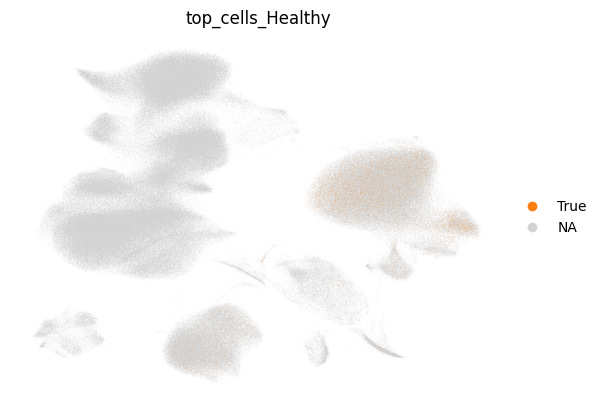

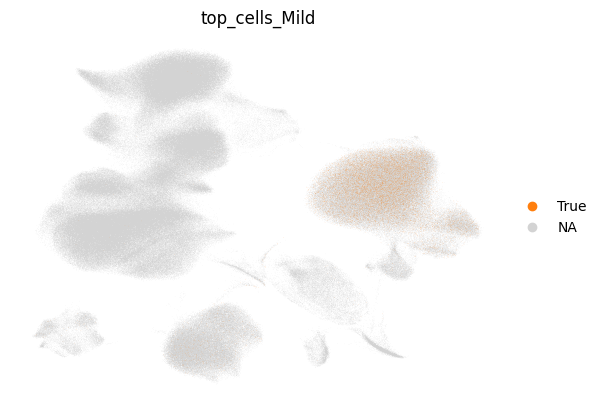

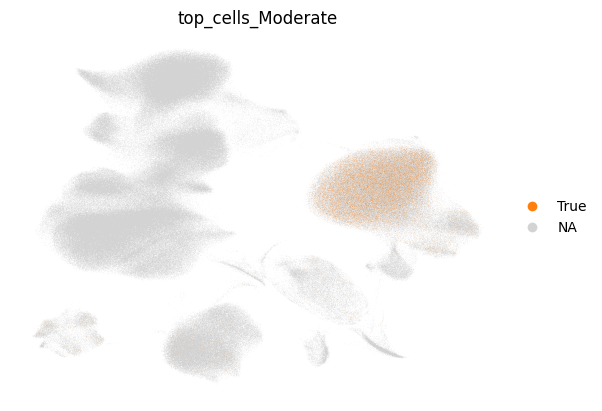

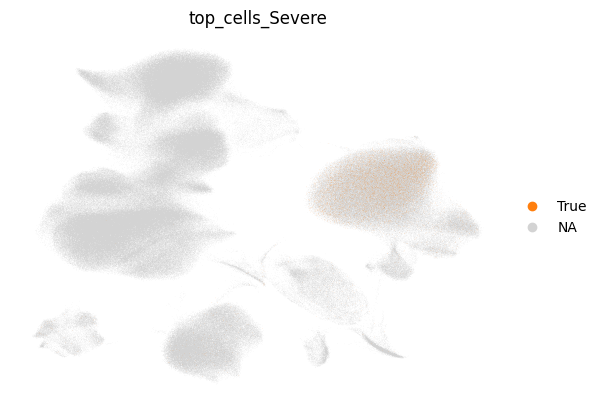

In [9]:
for cond in np.unique(adata.obs['Status_on_day_collection_summary']):
    sc.pl.umap(adata, color=[f'top_cells_{cond}'], groups=[True], frameon=False)

In [10]:
df = pd.concat(dfs)
df

,initial_clustering,Status_on_day_collection_summary
covid_index,,
AAACCTGGTCTCTCTG-MH9143425,CD14,Asymptomatic
AAACCTGTCCTCATTA-MH9143425,CD14,Asymptomatic
AAACGGGCATTGGCGC-MH9143425,CD14,Asymptomatic
AAAGATGAGGCGATAC-MH9143425,CD14,Asymptomatic
AAAGCAACAAGTACCT-MH9143425,CD14,Asymptomatic
...,...,...
BGCV15_TCTTTCCTCTGATACG-1,B_cell,Severe
BGCV15_TGCGGGTCAGGTGGAT-1,CD14,Severe
BGCV15_TGCTACCCAGTCAGAG-1,CD14,Severe


In [11]:
df_group = df.groupby('Status_on_day_collection_summary').value_counts(normalize=True).mul(100)
df_group

Status_on_day_collection_summary  initial_clustering
Asymptomatic                      CD14                  40.107111
                                  B_cell                30.377864
                                  CD8                    6.991967
                                  CD4                    5.682832
                                  NK_16hi                3.570366
                                                          ...    
Severe                            RBC                    0.344960
                                  pDC                    0.127763
                                  CD4                    0.038329
                                  CD8                    0.025553
                                  NK_56hi                0.012776
Length: 96, dtype: float64

In [12]:
df_group = df_group.unstack().reindex(['Asymptomatic', 'Healthy', 'Mild', 'Moderate', 'Severe', 'Critical'])

In [13]:
df_group

initial_clustering,B_cell,CD14,CD16,CD4,CD8,DCs,HSC,Lymph_prolif,MAIT,Mono_prolif,NK_16hi,NK_56hi,Plasmablast,Platelets,RBC,Treg,gdT,pDC
Status_on_day_collection_summary,,,,,,,,,,,,,,,,,,
Asymptomatic,30.377864,40.107111,1.517406,5.682832,6.991967,3.243082,0.119012,0.238024,0.386790,NaN,3.570366,0.297530,1.190122,2.618268,2.082713,0.357037,0.446296,0.773579
Healthy,11.964138,64.478566,14.148805,1.185078,0.669827,2.669002,0.010305,NaN,0.020610,0.041220,0.298846,0.041220,0.309151,2.401072,0.978978,0.154575,0.113355,0.515251
Mild,4.553479,83.558923,10.372223,0.110343,0.088274,0.375166,0.007356,NaN,0.036781,0.080918,0.029425,0.007356,0.301604,0.132411,0.308960,0.007356,0.014712,0.014712
Moderate,1.943214,89.221708,5.527588,0.055377,0.035240,0.151027,0.015103,0.015103,NaN,0.171164,0.005034,NaN,1.399517,1.233387,0.151027,0.005034,NaN,0.070479
Severe,1.827009,90.634981,4.331161,0.038329,0.025553,0.357736,NaN,NaN,NaN,0.511051,NaN,0.012776,0.638814,1.149866,0.344960,NaN,NaN,0.127763
Critical,5.255998,72.743013,6.220628,0.667821,1.409844,0.531783,0.061835,0.123671,0.012367,0.692555,0.544150,0.086569,3.487509,6.715310,1.162503,0.086569,0.123671,0.074202


In [14]:
color = []
for ct in df_group.columns:
    idx = list(adata.obs['initial_clustering'].cat.categories).index(ct)
    color.append(adata.uns['initial_clustering_colors'][idx])
len(color)

18

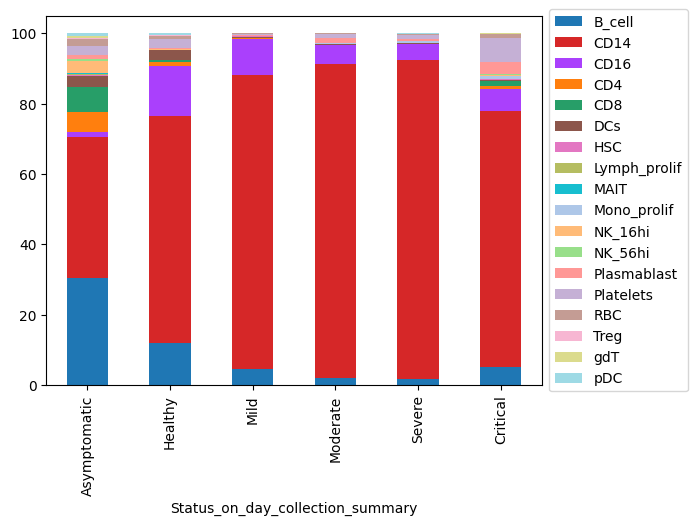

In [15]:
df_group.plot.bar(stacked=True, color=color).legend(loc='center left',bbox_to_anchor=(1.0, 0.5))

In [16]:
mono = adata[adata.obs['initial_clustering'] == 'CD14'].copy()
mono

AnnData object with n_obs × n_vars = 121283 × 2000
    obs: 'sample_id', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'full_clustering', 'initial_clustering', 'Resample', 'Collection_Day', 'Sex', 'Age_interval', 'Swab_result', 'Status', 'Smoker', 'Status_on_day_collection', 'Status_on_day_collection_summary', 'Days_from_onset', 'Site', 'time_after_LPS', 'Worst_Clinical_Status', 'Outcome', 'patient_id', 'split0', 'split1', 'split2', 'split3', 'split4', 'group', 'cell_attn_0', 'cell_attn_1', 'cell_attn_2', 'cell_attn_3', 'cell_attn_4', 'cell_attn', 'top_cells_Asymptomatic', 'top_cells_Critical', 'top_cells_Healthy', 'top_cells_Mild', 'top_cells_Moderate', 'top_cells_Severe'
    var: 'feature_types', 'means', 'variances', 'residual_variances', 'highly_variable_rank', 'highly_variable_nbatches', 'highly_variable_intersection', 'highly_variable'
    uns: 'hvg', 'leiden', 'neighbors', 'pca', 'umap', 'Status_on_day_collection_summary_colors', 'initial_cl

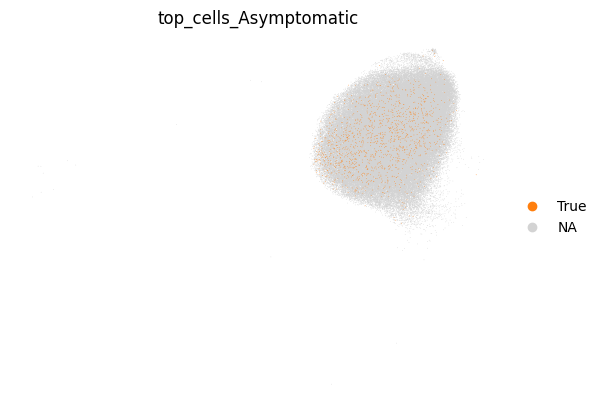

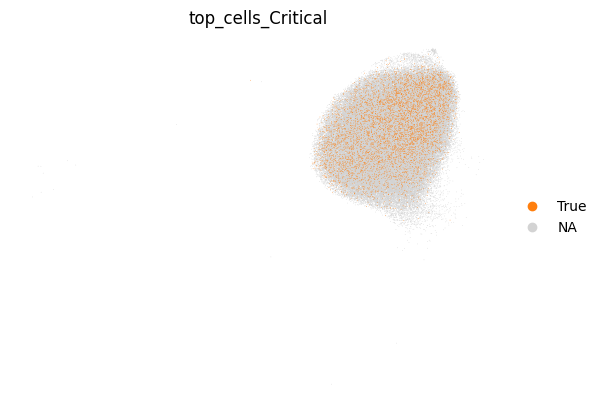

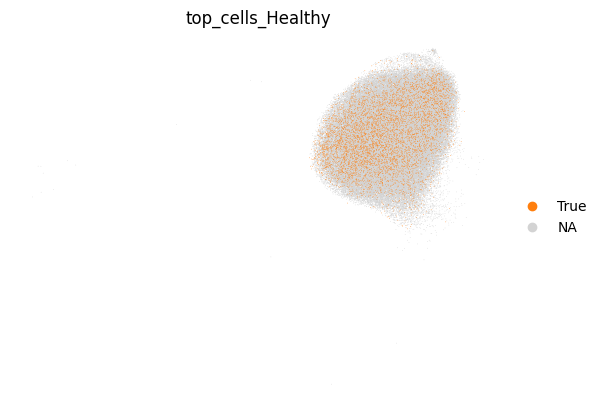

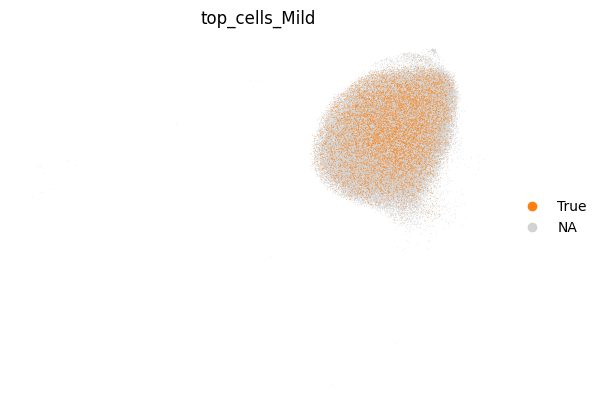

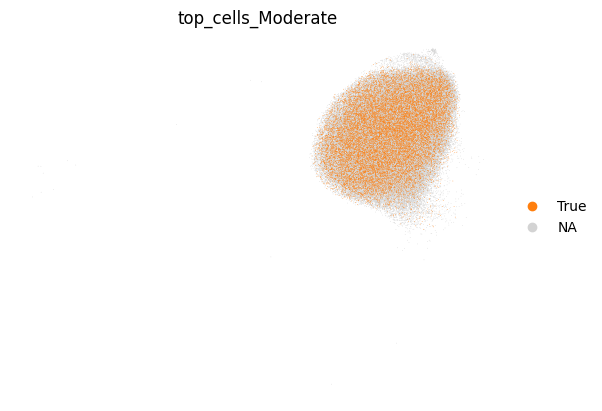

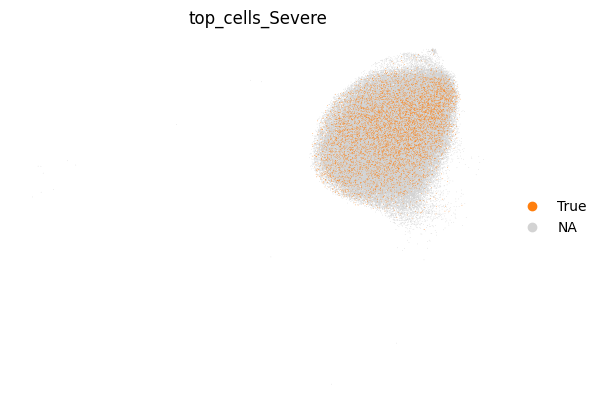

In [17]:
for cond in np.unique(mono.obs['Status_on_day_collection_summary']):
    sc.pl.umap(mono, color=[f'top_cells_{cond}'], groups=[True], frameon=False)